<table align="left"><td>
  <a target="_blank"  href="https://colab.research.google.com/github/beam-data/cv-intro/blob/master/notebooks/tf2-ic-fine-tune.ipynb">
    <img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab
  </a>
</td><td>
  <a target="_blank"  href="https://github.com/beam-data/cv-intro/blob/master/notebooks/tf2-ic-fine-tune.ipynb">
    <img width=32px src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
</td><td>
  <a target="_blank"  href="http://beamdata.ca/">
    <img width=128px src="https://weclouddata.com/wp-content/uploads/2019/06/logo-w@3x.png" /></a>
</td></table>

## Setting up the system and importing the data

In [ ]:
import os 
import pathlib
import zipfile 
import tensorflow as tf 
from keras.preprocessing.image import ImageDataGenerator 
from keras import layers 
from keras import Model 
import matplotlib.pyplot as plt
import tarfile
import cv2
from keras.callbacks import TensorBoard
from keras.preprocessing import image
import warnings 
import random, glob
from PIL import Image, ImageDraw, ImageFont   

In [ ]:
from google.colab import auth
auth.authenticate_user()

In [ ]:
from google.colab import drive
drive.mount('/content/data', force_remount=True)

Mounted at /content/data


In [ ]:
!gsutil ls gs://minib_data/data/classification

gs://minib_data/data/classification/blocked/
gs://minib_data/data/classification/clear/


In [ ]:
softmax = False #@param {type:"boolean"}

if softmax:
  DIR = tf.keras.utils.get_file(origin='https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz',
                                         fname='flower_photos', untar=True)
  data_dir = pathlib.Path(DIR)
  os.remove(f'{data_dir}/LICENSE.txt')

else:
  !gsutil -m cp -r gs://minib_data/data/classification .
  data_dir = 'classification'

In [ ]:
!ls {data_dir}

blocked  clear


In [ ]:
class_dir_train = os.listdir(data_dir)
for dir in class_dir_train:
  print(f'total training {dir} images:', len(os.listdir(f'{data_dir}/'+ dir)))

total training clear images: 624
total training blocked images: 363


In [ ]:
!pip install split-folders

In [ ]:
import splitfolders  # or import split_folders
import shutil

if os.path.isdir('output'):
  shutil.rmtree('output')

# Split with a ratio.
# To only split into training and validation set, set a tuple to `ratio`, i.e, `(.8, .2)`.
splitfolders.ratio(data_dir, output="output", seed=1337, ratio=(.6, .2, .2), group_prefix=None) # default values

Copying files: 987 files [00:00, 2202.95 files/s]


In [ ]:
train_dir = 'output/train/'
class_dir_train = os.listdir(train_dir)
for dir in class_dir_train:
  print(f'total training {dir} images:', len(os.listdir(f'{train_dir}{dir}')))

total training clear images: 374
total training blocked images: 217


In [ ]:
val_dir = 'output/val/'
class_dir_val = os.listdir(val_dir)
for dir in class_dir_val:
  print(f'total validation {dir} images:', len(os.listdir(f'{val_dir}{dir}')))

total validation clear images: 124
total validation blocked images: 72


In [ ]:
test_dir = 'output/test/'
class_dir_test = os.listdir(test_dir)
for dir in class_dir_test:
  print(f'total testing {dir} images:', len(os.listdir(f'{test_dir}{dir}')))

total testing clear images: 126
total testing blocked images: 74


In [ ]:
import random

if softmax:
  choice = random.choice(['tulips', 'dandelion', 
                         'sunflowers', 'daisy', 'roses'])
  pic_dir = f'output/train/{choice}'
else:
  pic_dir = 'output/train/blocked'

images = glob.glob(f'{pic_dir}/*')

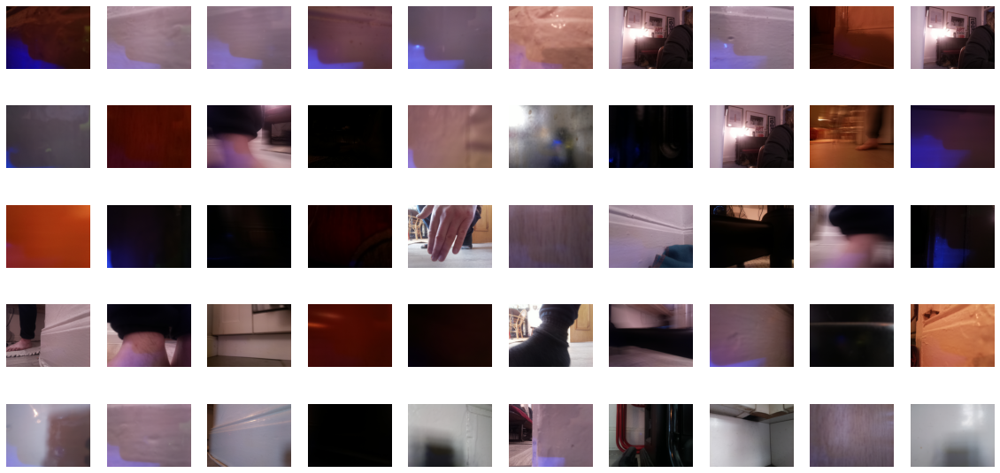

In [ ]:
# Set up matplotlib fig, and size it to fit 4x4 pics
import matplotlib.image as mpimg
nrows = 5
ncols = 10
pic_index = 0

fig = plt.gcf()
fig.set_size_inches(ncols*2, nrows*2)
pic_index += 50
fnames_dir = os.listdir( pic_dir )

next_pic = [os.path.join(pic_dir, fname) 
                for fname in fnames_dir[pic_index-50:pic_index] 
               ]

for i, img_path in enumerate(next_pic):

  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') 

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

In [ ]:
%matplotlib inline
import os 
import matplotlib.pyplot as plt
from keras.preprocessing.image import ImageDataGenerator,  img_to_array, load_img
def generate_plot_pics(datagen,orig_img):


    dir_augmented_data = "/content/aug_data/"
    try:
        os.mkdir(dir_augmented_data)
    except:
        for item in os.listdir(dir_augmented_data):
            os.remove(dir_augmented_data + "/" + item)

    ## convert the original image to array
    x = img_to_array(orig_img)
    ## reshape (Sampke, Nrow, Ncol, 3) 3 = R, G or B
    x = x.reshape((1,) + x.shape)
    i = 0
    Nplot = 8
    for batch in datagen.flow(x,batch_size=1,
                          save_to_dir=dir_augmented_data,
                          save_prefix="pic",
                          save_format='jpeg'):
        i += 1
        if i > Nplot - 1: ## generate 8 pictures 
            break

    fig = plt.figure(figsize=(8, 6))
    fig.subplots_adjust(hspace=0.02,wspace=0.01,
                    left=0,right=1,bottom=0, top=1)

    ## original picture
    ax = fig.add_subplot(3, 3, 1,xticks=[],yticks=[])        
    ax.imshow(orig_img)
    ax.set_title("original")

    i = 2
    for imgnm in os.listdir(dir_augmented_data):
        ax = fig.add_subplot(3, 3, i,xticks=[],yticks=[]) 
        img = load_img(dir_augmented_data + "/" + imgnm)
        ax.imshow(img)
        i += 1
    plt.show()

## 4. EfficientNet

In [ ]:
!pip install -U efficientnet

     |████████████████████████████████| 50 kB 3.0 MB/s 


In [ ]:
import efficientnet.keras as efn

## Step 1: Image Augmentation

In [ ]:
class_mode = 'binary'

train_datagen = ImageDataGenerator(rescale = 1./255., rotation_range = 90, width_shift_range = 1.0, 
                                   height_shift_range = 1.0, shear_range = 0.2, zoom_range = [0.9,1], 
                                   horizontal_flip = True, vertical_flip = True, brightness_range=(0.2,3.0))

val_datagen = ImageDataGenerator(rescale = 1.0/255.)
test_datagen = ImageDataGenerator(rescale = 1.0/255.)

train_generator = train_datagen.flow_from_directory(train_dir, batch_size = 64, class_mode = class_mode, target_size = (224, 224))

validation_generator = val_datagen.flow_from_directory(val_dir, batch_size = 16, class_mode = class_mode, target_size = (224, 224))

#addition
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(224, 224),
        color_mode="rgb",
        shuffle = False,
        class_mode=class_mode,
        batch_size=1)


Found 591 images belonging to 2 classes.
Found 196 images belonging to 2 classes.
Found 200 images belonging to 2 classes.


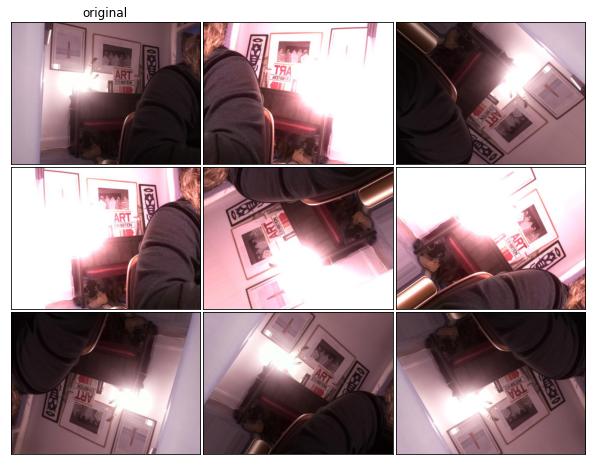

In [ ]:
img = load_img(images[9])
generate_plot_pics(train_datagen, img)

In [ ]:
from PIL import Image, ImageEnhance
image = Image.open(images[9])
contrast = ImageEnhance.Brightness(image)
img_new = contrast.enhance(2.3)

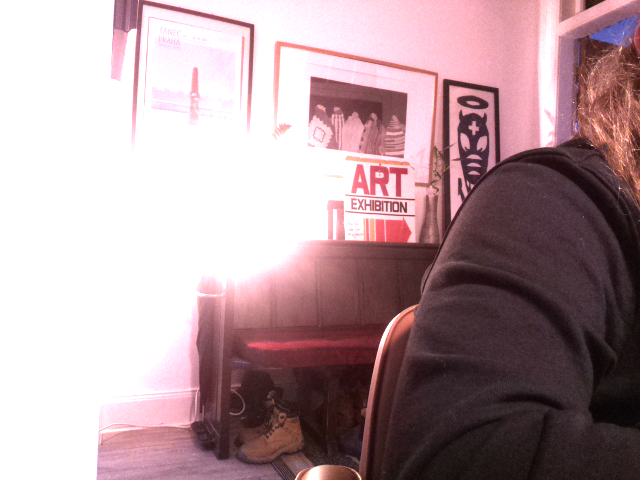

In [ ]:
img_new

## Step 2: Loading the Base Model

In [ ]:
base_model = tf.keras.applications.EfficientNetB3(input_shape = (300, 300, 3), include_top = False, weights = 'imagenet', drop_connect_rate=0.4)

#model = EfficientNetB1(weights="efficientnetb1_notop.h5", include_top=False)

43941888/43941136 [==============================] - 0s 0us/step


In [ ]:
base_model.summary()

In [ ]:
base_model.input

<KerasTensor: shape=(None, 300, 300, 3) dtype=float32 (created by layer 'input_1')>

In [ ]:
train_top = False #@param {type:"boolean"}

if train_top:
  for layer in base_model.layers:
      layer.trainable = False
else:
  for layer in model.layers[-20:]:
          if not isinstance(layer, layers.BatchNormalization):
              layer.trainable = True

In [ ]:
for i, layer in enumerate(base_model.layers):
    print(i, layer.name, layer.trainable)

0 input_1 True
1 rescaling True
2 normalization True
3 stem_conv_pad True
4 stem_conv True
5 stem_bn True
6 stem_activation True
7 block1a_dwconv True
8 block1a_bn True
9 block1a_activation True
10 block1a_se_squeeze True
11 block1a_se_reshape True
12 block1a_se_reduce True
13 block1a_se_expand True
14 block1a_se_excite True
15 block1a_project_conv True
16 block1a_project_bn True
17 block1b_dwconv True
18 block1b_bn True
19 block1b_activation True
20 block1b_se_squeeze True
21 block1b_se_reshape True
22 block1b_se_reduce True
23 block1b_se_expand True
24 block1b_se_excite True
25 block1b_project_conv True
26 block1b_project_bn True
27 block1b_drop True
28 block1b_add True
29 block2a_expand_conv True
30 block2a_expand_bn True
31 block2a_expand_activation True
32 block2a_dwconv_pad True
33 block2a_dwconv True
34 block2a_bn True
35 block2a_activation True
36 block2a_se_squeeze True
37 block2a_se_reshape True
38 block2a_se_reduce True
39 block2a_se_expand True
40 block2a_se_excite True
41 

## Step 3: Build the model

In [ ]:
# Rebuild top
top_dropout_rate = 0.2
x = tf.keras.layers.GlobalAveragePooling2D(name="avg_pool")(base_model.output)
x = tf.keras.layers.Dropout(top_dropout_rate, name="top_dropout")(x)
outputs = tf.keras.layers.Dense(1, activation="sigmoid")(x)

# Compile
model = tf.keras.Model(base_model.input, outputs, name="EfficientNet")

In [ ]:
model.summary()

Model: "EfficientNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 300, 300, 3) 0                                            
__________________________________________________________________________________________________
rescaling (Rescaling)           (None, 300, 300, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
normalization (Normalization)   (None, 300, 300, 3)  7           rescaling[0][0]                  
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, 301, 301, 3)  0           normalization[0][0]              
_______________________________________________________________________________________

## Step 4: Compile and Fit

In [ ]:
#!pip install focal-loss==0.0.6
!pip install tensorflow-addons

     |████████████████████████████████| 679 kB 5.0 MB/s 


In [ ]:
import tensorflow_addons as tfa

lookahead = False #@param {type:"boolean"}

filepath = '/content/data/MyDrive/testing_ground/cv-intro/models/binary.h5'

if train_top:
  lr = 0.01
else:
  lr = 0.0001

opt = tf.keras.optimizers.Adam(learning_rate=lr)
es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)
mc = tf.keras.callbacks.ModelCheckpoint(filepath, monitor='val_loss', mode='min', verbose=1, save_best_only=True)
#cg = keras.callbacks.LambdaCallback(on_epoch_end=show_frame)
tb = tf.keras.callbacks.TensorBoard(log_dir='./logs')
rlr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1,
                              patience=10)

if lookahead:
  model.compile(tfa.optimizers.Lookahead(opt),loss='binary_crossentropy',metrics=['acc'])

else:
  model.compile(optimizer=opt,loss='binary_crossentropy',metrics=['acc'])


In [ ]:
history = model.fit(train_generator,
                               validation_data = validation_generator, 
                               callbacks=[es, tb, rlr, mc],
                               epochs = 400)


In [ ]:
%reload_ext tensorboard
%tensorboard --logdir 'logs'

Reusing TensorBoard on port 6006 (pid 98), started 0:50:43 ago. (Use '!kill 98' to kill it.)

<IPython.core.display.Javascript object>

#Reloading

In [ ]:
import keras

filepath = '/content/data/MyDrive/testing_ground/cv-intro/models/flowers.h5'

reloaded_model = keras.models.load_model(filepath)
reloaded_model.fit_generator(train_generator,
                          validation_data = validation_generator, 
                          callbacks=[es, tb, rlr, mc],
                          epochs = 400)

In [ ]:
model = efficientnet_model

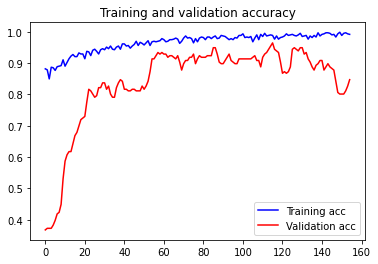

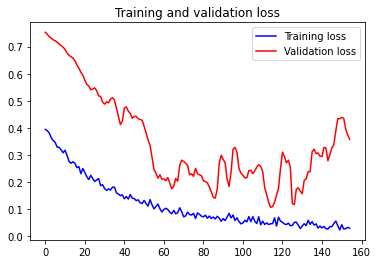

In [ ]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_x = range(len(acc))

plt.plot(epochs_x, acc, 'b', label='Training acc')
plt.plot(epochs_x, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_x, loss, 'b', label='Training loss')
plt.plot(epochs_x, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
model_final.save('/content/data/My Drive/testing ground/beamdata/efficientnetB0_model.h5')

In [ ]:
test_generator = test_datagen.flow_from_directory(test_dir, batch_size = 1, class_mode = class_mode, target_size = (224, 224), shuffle=False)

Found 200 images belonging to 2 classes.


In [ ]:
target_names = []

for key in train_generator.class_indices:

    target_names.append(key)

print(target_names)


['blocked', 'clear']


#Visualization

Before we take a look at some prediction results let's see if we can intuit how our model's doing from the weights it has learnt

In [ ]:
filepath = '/content/data/MyDrive/testing_ground/cv-intro/models/binary.h5'

In [ ]:
load = True
if load:
  model = tf.keras.models.load_model(filepath)

In [ ]:
import numpy as np
from keras.preprocessing import image
import matplotlib.pyplot as plt

img = image.load_img(images[11], target_size=(300,300))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.


In [ ]:
from keras import models

layer_outputs = [layer.output for layer in model.layers[17:20]] 
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

In [ ]:
layer_names = [layer.name for layer in model.layers[17:20]]
layer_names

['block1b_dwconv', 'block1b_bn', 'block1b_activation']

In [ ]:
activations = activation_model.predict(img_tensor)

In [ ]:
for layer_name, layer_activation in zip(layer_names, activations): 
  print(layer_activation.shape, layer_name)

(1, 150, 150, 24) block1b_dwconv
(1, 150, 150, 24) block1b_bn
(1, 150, 150, 24) block1b_activation


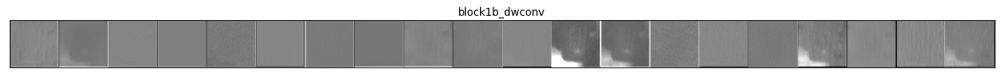

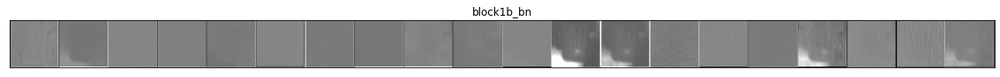

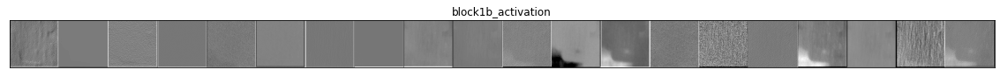

In [ ]:
images_per_row = 20
for layer_name, layer_activation in zip(layer_names, activations): 
    n_features = layer_activation.shape[-1] 
    size = layer_activation.shape[1] 
    n_cols = n_features // images_per_row 
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    for col in range(n_cols): 
        for row in range(images_per_row):
            try:
              channel_image = layer_activation[0,:, :,col * images_per_row + row]
              channel_image -= channel_image.mean()
              channel_image /= channel_image.std()
              channel_image *= 64
              channel_image += 128
              channel_image = np.clip(channel_image, 0, 255).astype('uint8')
              display_grid[col * size : (col + 1) * size,
                          row * size : (row + 1) * size] = channel_image
            except IndexError:
              pass
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.yticks([])
    plt.xticks([])
    plt.imshow(display_grid, aspect='auto', cmap='gray')
    
    #scale * display_grid.shape[1]
    #scale * display_grid.shape[0]

In [ ]:
#predict = model_final.predict_generator(test_generator,steps = nb_samples)

In [ ]:
test_generator.reset()
step_size=test_generator.n//test_generator.batch_size


pred = model.predict_generator(test_generator, steps = step_size, verbose = 1)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:2001: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


200/200 [==============================] - 6s 20ms/step


In [ ]:
import numpy as np
#working 
labels = test_generator.classes

if softmax:
  pred_class = pred.argmax(axis=-1)
else:
  pred_class = np.where((pred) > 0.5, 1, 0)
  pred_class= pred_class.ravel()


labels_dict = {v: k for k, v in train_generator.class_indices.items()}
predictions = [labels_dict[k] for k in pred_class]
actual = [labels_dict[k] for k in labels]

In [ ]:
import random

filenames =test_generator.filenames
data = list(zip(predictions, actual,filenames))

200/200 [==============================] - 6s 21ms/step - loss: 0.1024 - acc: 0.9650


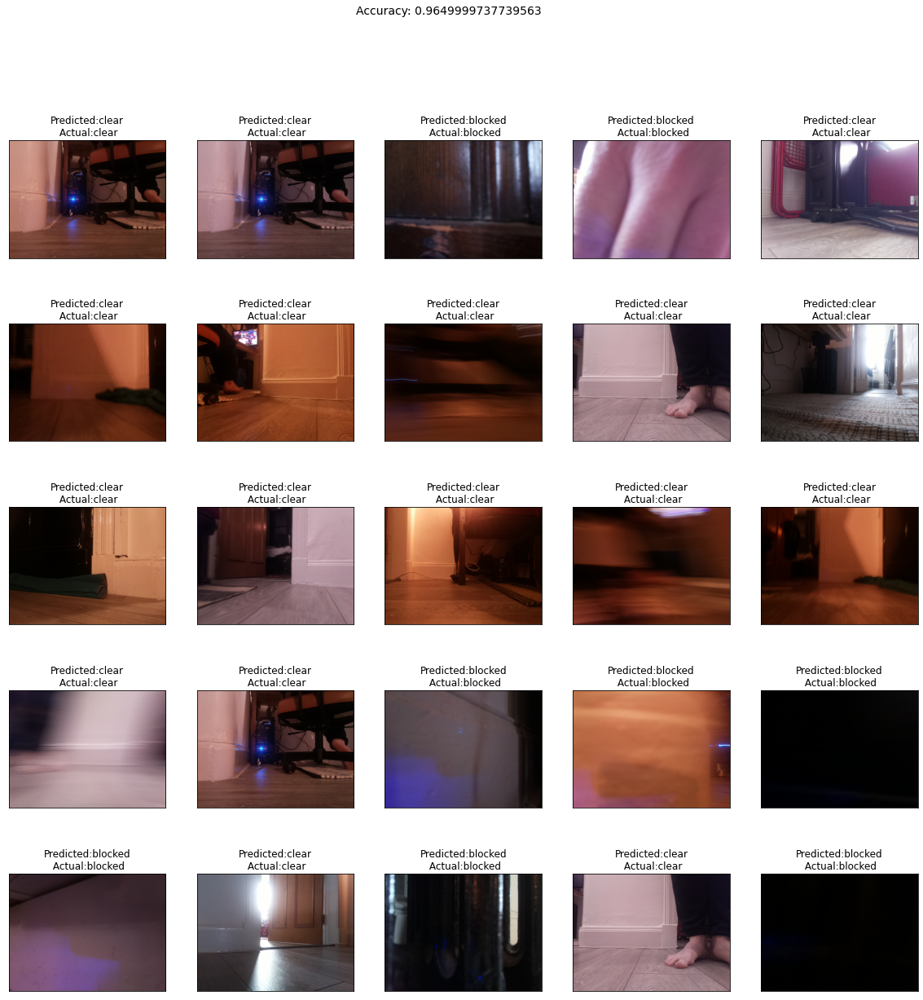

In [ ]:
random.shuffle(data)
pred_class, labels, filenames = zip(*data)

scores = model.evaluate(test_generator) 
#print("Accuracy = ", scores[1])

plt.figure(figsize=(20,20))
for i in range(25):
  img = cv2.imread(test_dir + data[i][2])
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  plt.subplot(5,5,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(img, cmap=plt.cm.binary)
  plt.title(f"Predicted:{data[i][0]}\n Actual:{data[i][1]}") 
plt.suptitle(f'Accuracy: {scores[1]}', fontsize=14)        
plt.show()

Challenge!
multi-class

In [ ]:
scores = model.evaluate(test_generator) 
print("Accuracy = ", scores[1])

200/200 [==============================] - 4s 22ms/step - loss: 0.1024 - acc: 0.9650
Accuracy =  0.9649999737739563


In [ ]:
model.save('avoidance')

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


INFO:tensorflow:Assets written to: flowers/assets


In [ ]:
!pip install onnxruntime
!pip install git+https://github.com/onnx/tensorflow-onnx

In [ ]:
!python -m tf2onnx.convert --saved-model avoidance --output /content/drive/MyDrive/testing_ground/cv-intro/models/avoidance.onnx --opset 13 --tag serve

#Challenge 2!

In [ ]:
def create_model(type='stacked', freeze=False, lr=0.0001, input_shape=(224,224)):
  
  input_t = Input(shape=input_shape)

  if type == 'stacked':
    x = Conv2D(32, (3, 3), padding='same', activation='relu')(input)
    x = Conv2D(32, (3, 3), padding='same', activation='relu')(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    
    x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
    x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)

    x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
    x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
    out = MaxPooling2D(pool_size=(2, 2))(x)

  elif type == 'transfer':
    #using vgg as a feature extractor
    #Weights for both are trained simultaneously - use low lr
    vgg = VGG16(include_top=False, weights='imagenet',  input_tensor=input_t)
    
    out = vgg.output
    input_t = vgg.input
  

  x = Flatten()(out)
  x = Dense(256, activation='relu')(x)
  x = Dropout(0.2)(x)
  #x = Dense(512, activation='relu')(x)
  #x = Dropout(0.2)(x)

  #train only the new layers
  if freeze:
    for layer in vgg.layers[:25]:
      layer.trainable = False


  output = Dense(classes, activation = 'softmax')(x)
  model = Model(inputs=input_t, outputs=output)


  model.compile(loss='categorical_crossentropy',
              optimizer= RMSprop(lr=1e-4),
              metrics=['accuracy'])
  
  return model
